### Exploratory Data Analysis 

In [1]:
import numpy as np
import pandas as pd
import altair as alt
from pandas_profiling import ProfileReport
from sklearn.model_selection import train_test_split

alt.renderers.enable('mimetype')

RendererRegistry.enable('mimetype')

In [2]:
X_train = pd.read_csv("../data/raw/X_train.csv", parse_dates=['year'])
X_train['year'] = X_train['year'].dt.year
y_train = pd.read_csv("../data/raw/y_train.csv")
train_df = X_train.join(y_train.set_index('carID'), on = "carID")

In [3]:
train_df.head()

,carID,brand,model,year,transmission,mileage,fuelType,tax,mpg,engineSize,price
0,13207,hyundi,Santa Fe,2019,Semi-Auto,4223,Diesel,145.0,39.8,2.2,31995
1,17314,vauxhall,GTC,2015,Manual,47870,Diesel,125.0,60.1,2.0,7700
2,12342,audi,RS4,2019,Automatic,5151,Petrol,145.0,29.1,2.9,58990
3,13426,vw,Scirocco,2016,Automatic,20423,Diesel,30.0,57.6,2.0,12999
4,16004,skoda,Scala,2020,Semi-Auto,3569,Petrol,145.0,47.1,1.0,16990


In [4]:
train_df.shape

(4960, 11)

In [5]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4960 entries, 0 to 4959
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   carID         4960 non-null   int64  
 1   brand         4960 non-null   object 
 2   model         4960 non-null   object 
 3   year          4960 non-null   int64  
 4   transmission  4960 non-null   object 
 5   mileage       4960 non-null   int64  
 6   fuelType      4960 non-null   object 
 7   tax           4960 non-null   float64
 8   mpg           4960 non-null   float64
 9   engineSize    4960 non-null   float64
 10  price         4960 non-null   int64  
dtypes: float64(3), int64(4), object(4)
memory usage: 426.4+ KB


In [6]:
train_df.describe()

,carID,year,mileage,tax,mpg,engineSize,price
count,4960.000000,4960.000000,4960.000000,4960.000000,4960.000000,4960.000000,4960.000000
mean,15832.446169,2016.737903,24956.286895,152.332661,50.370766,2.124375,23469.943750
std,2206.717006,2.884035,24443.333662,82.403844,35.746505,0.789368,16406.714563
min,12002.000000,1997.000000,1.000000,0.000000,2.800000,0.000000,450.000000
25%,13929.250000,2016.000000,5641.250000,145.000000,38.700000,1.600000,12000.000000
50%,15840.000000,2017.000000,19000.000000,145.000000,47.100000,2.000000,18999.000000
75%,17765.750000,2019.000000,36702.000000,150.000000,54.300000,2.800000,30335.750000
max,19629.000000,2020.000000,259000.000000,580.000000,470.800000,6.600000,145000.000000


In [7]:
profile = ProfileReport(train_df, title="Pandas Profiling Report")

In [8]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
profile.to_file("pandas_profiling.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

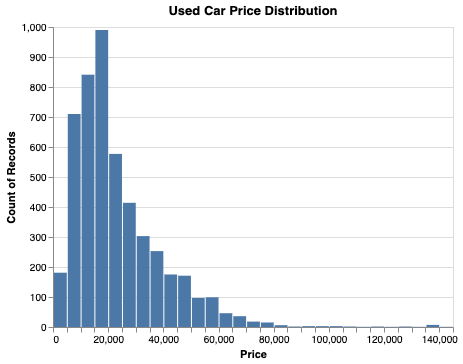

In [16]:
alt.Chart(train_df, title ="Used Car Price Distribution").mark_bar().encode(
    alt.X('price', bin=alt.Bin(maxbins=30), title="Price"),
    y='count()')

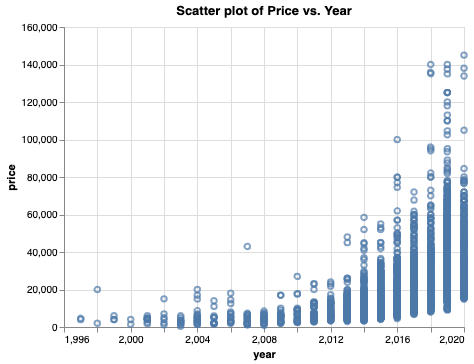

In [11]:
alt.Chart(train_df, title ="Scatter plot of Price vs. Year").mark_point().encode(
    alt.X('year',scale=alt.Scale(zero=False)),
    y='price',
)

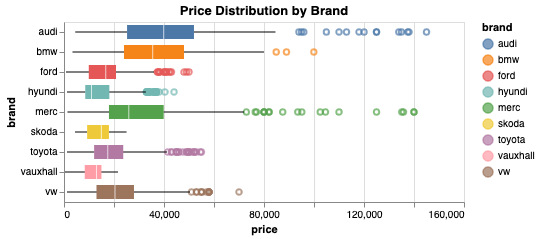

In [12]:
(alt.Chart(train_df, title="Price Distribution by Brand")
 .mark_boxplot().encode(
     x='price',
     y=alt.Y('brand'),
     color='brand'))

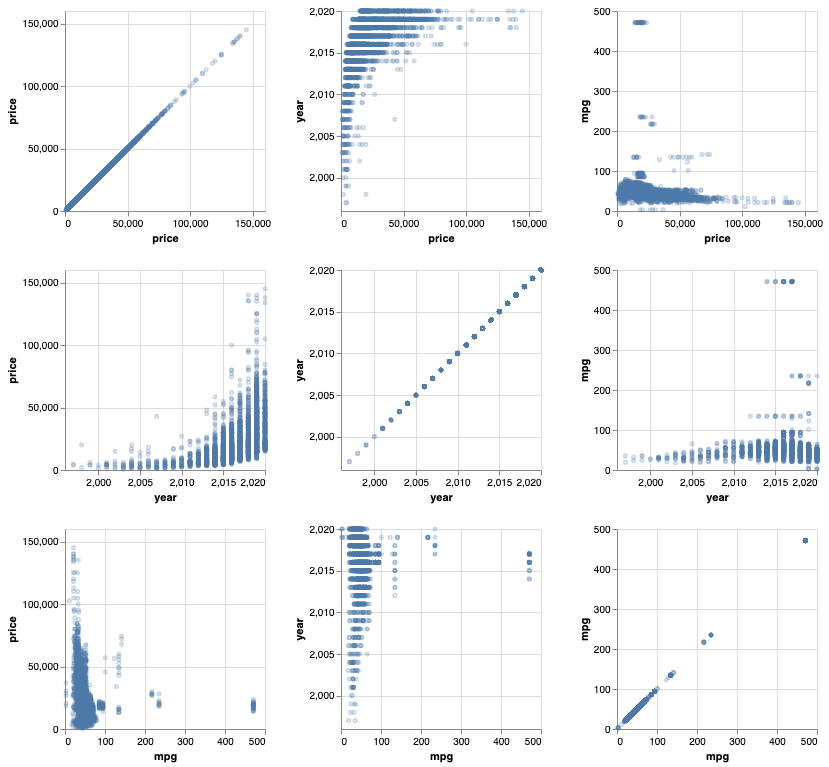

In [13]:
alt.Chart(train_df).mark_point(opacity=0.3, size=10).encode(
     alt.X(alt.repeat('row'), type='quantitative', scale=alt.Scale(zero=False)),
     alt.Y(alt.repeat('column'), type='quantitative', scale=alt.Scale(zero=False))
).properties(
    width=200,
    height=200
).repeat(
    column=['price', 'year', 'mpg'],
    row=['price', 'year', 'mpg']
)

In [14]:
np.percentile(train_df['price'], [25 ,75])

array([12000.  , 30335.75])